In [79]:
# import packages 
import os
import sys
sys.path.append(os.path.join("..", ".."))
import cv2
import numpy as np
from utils.imutils import jimshow
from utils.imutils import jimshow_channel
#import matplotlib.pyplot as plt
#import matplotlib as mpl

In [80]:
# read image
fname = os.path.join("data", "image.png")
image = cv2.imread(fname)

In [ ]:
# define image corners 
top = (image.shape[0]//2) - 750
bottom = (image.shape[0]//2) + 1180

left = (image.shape[1]//2) - 800
right = (image.shape[1]//2) + 700

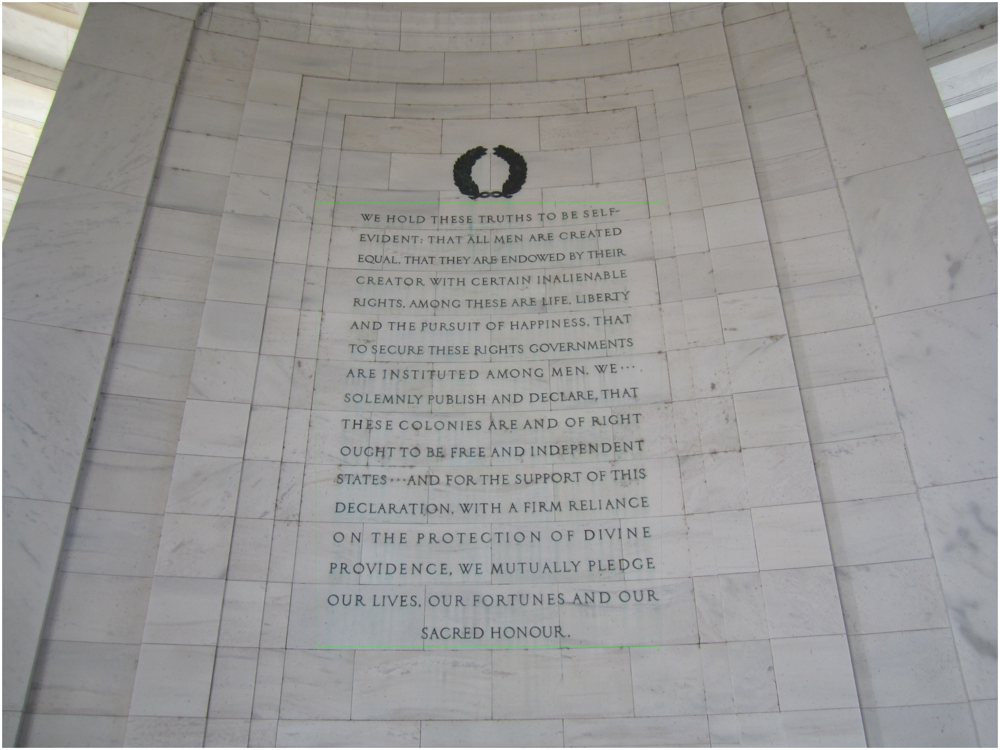

In [83]:
# draw rectangle 
im_rectangle = cv2.rectangle(image, (right, top), (left, bottom), (0, 255, 0), 1)
jimshow(im_rectangle)

In [84]:
# save image with rectangle 
outpath = os.path.join("output", "image_with_ROI.png")
cv2.imwrite(outpath, im_rectangle)

True

In [87]:
# crop image
cropped = image[top:bottom, left:right]

# save cropped image
outpath = os.path.join("output", "image_cropped.png")
cv2.imwrite(outpath, cropped)


True

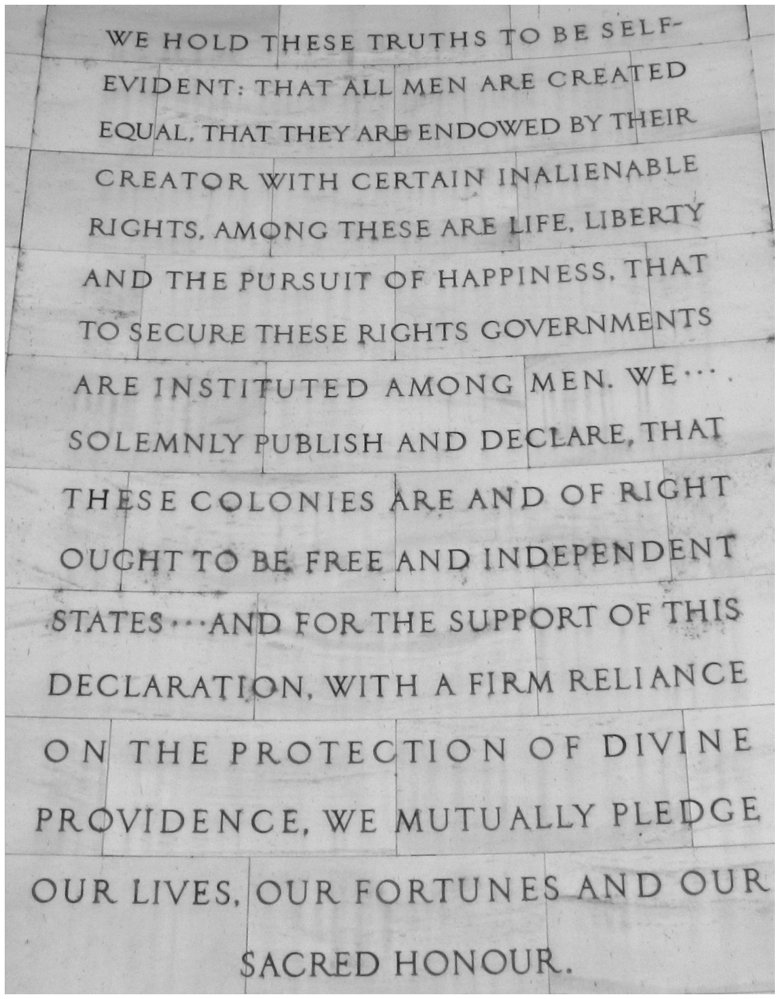

In [89]:
# read in saved image
filename = os.path.join("output", "image_cropped.png")
image_crop = cv2.imread(filename)

# convert image to greyscale to enable edge detection
grey_image = cv2.cvtColor(image_crop, cv2.COLOR_BGR2GRAY)

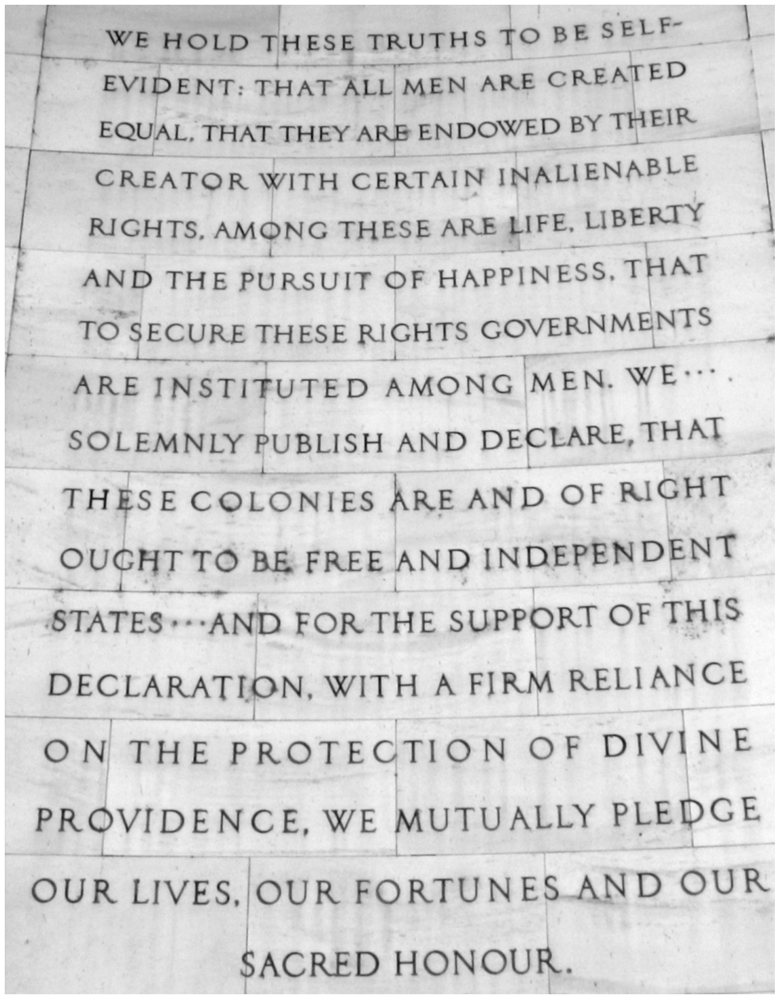

In [90]:
# blur image as part of edge detection
blurred = cv2.GaussianBlur(grey_image, (5,5), 0)


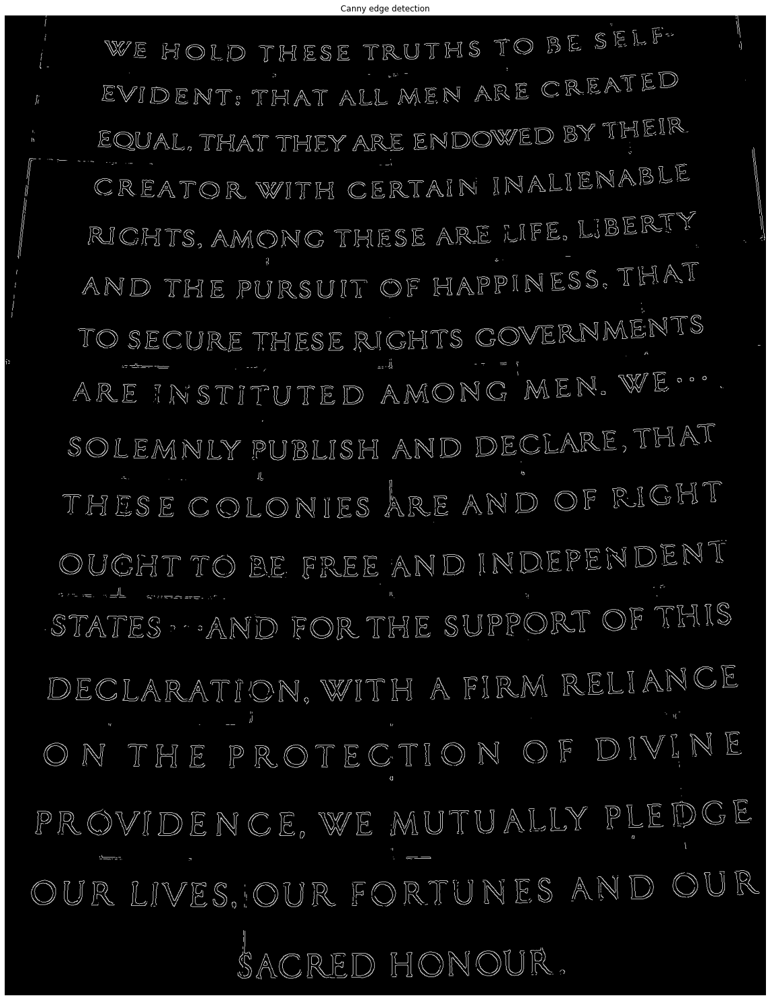

In [109]:
# apply canny edge detection
canny = cv2.Canny(blurred, 120, 120)


In [110]:
# pick out just the outer contours of the detected objects 
(contours, _) = cv2.findContours(canny.copy(), 
                 cv2.RETR_EXTERNAL, 
                 cv2.CHAIN_APPROX_SIMPLE)

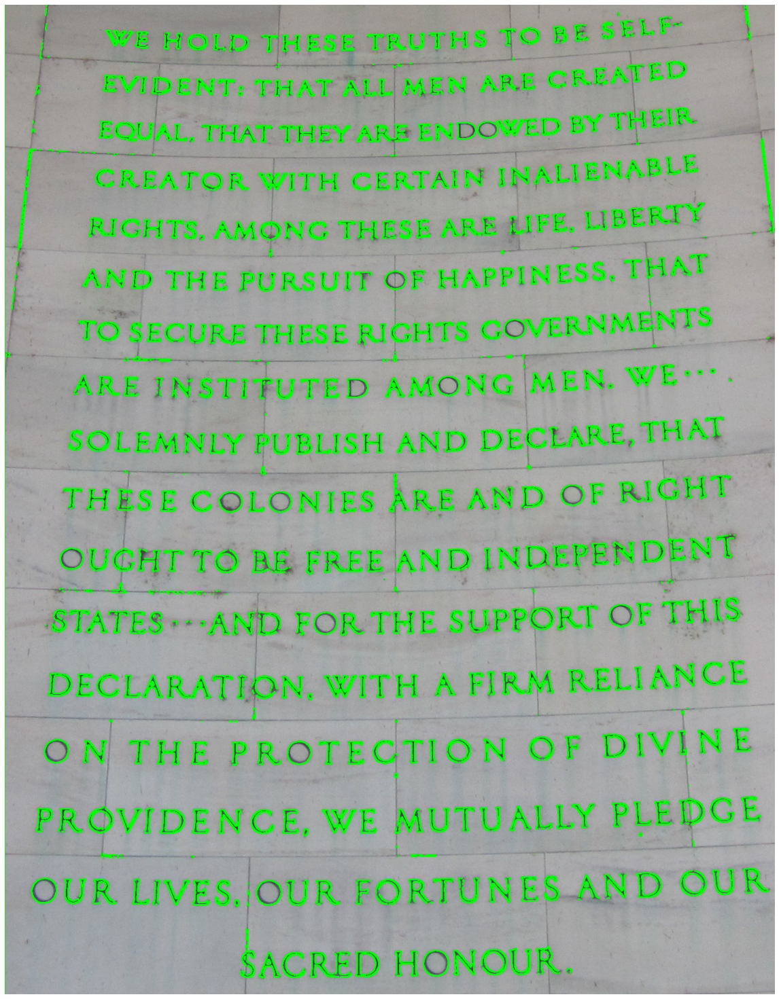

In [111]:
# draw contours/edges on the image 
im = cv2.drawContours(cropped.copy(), 
                        contours,      
                         -1,           
                         (0,255,0),    
                         2)  

# save image with the detected edges 
outpath = os.path.join("output", "image_letters.png")
cv2.imwrite(outpath, im)